This notebook is a slightly modified version of the colab notebook provided by Quei-An Chen to train and test the pytorch-lightning implementation of NeRF with a custom dataset. The following is the  link to the Github page with more implementation details: https://github.com/kwea123/nerf_pl/

# Installation (only required for the first run)

In [ ]:
!git clone --recursive https://github.com/kwea123/nerf_pl

%cd /content/nerf_pl
!pip install -r requirements.txt

%cd /content/nerf_pl/torchsearchsorted
!pip install .

# Mount your google drive (to access data)

In [ ]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


# Train! (depending on number of epochs, takes about 5~8 hours)

### model weights are saved to `ckpts/$EXP`
### training logs (loss/PSNR evolution) are saved to `logs/$EXP`

Run the following piece of code in the console of the page inspector (i.e. right click on this webpage and choose inspector) to keep the session active even if you are away:

```
function ClickConnect(){
console.log("Working"); 
document
  .querySelector('#top-toolbar > colab-connect-button')
  .shadowRoot.querySelector('#connect')
  .click() 
}
setInterval(ClickConnect,60000)
```





## Forward facing scene

### Use to check and resize images

In [ ]:
# Obtain current image sizes

import PIL

# get image width height
image_seg = PIL.Image.open("/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/images/frame_000125_rec_B.png")
width_seg, height_seg = image_seg.size

# image = PIL.Image.open("/content/drive/MyDrive/Grad/research/nerf/EndoSlam/HighCam/Stomach-III/TumorfreeTrajectory_4/images_orig/frame_000126.jpg")
# width, height = image.size

print(width_seg, height_seg)
# print(width, height)


256 256


In [ ]:
# Resize images to 640x480

import os 

image_dir = "/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/images_unsized"
save_dir = "/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/images"

WIDTH = 640
HEIGHT = 480

for filename in os.listdir(image_dir):
  image = PIL.Image.open(image_dir+"/"+filename)
  resized_img = image.resize((WIDTH, HEIGHT))
  resized_img.save(save_dir+"/"+filename)


In [ ]:
# Check resized image sizes

# get image width, height
image_seg = PIL.Image.open("/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/images/frame_000125_rec_B.png")
width_seg, height_seg = image_seg.size

print(width_seg, height_seg)

640 480


### Train the model

In [ ]:
%cd /content/nerf_pl

import os
# set training configurations here
os.environ['ROOT_DIR'] = "/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions"
                         # directory containing the data
os.environ['IMG_W'] = "640" # image width (do not set too large)
os.environ['IMG_H'] = "480" # image height (do not set too large)
os.environ['NUM_EPOCHS'] = "10" # number of epochs to train (depending on how many images there are,
                                # 20~30 might be enough)
os.environ['EXP'] = "stomach-III_1" # name of the experience (arbitrary)

!python train.py \
   --dataset_name llff \
   --root_dir "$ROOT_DIR" \
   --N_importance 64 --img_wh $IMG_W $IMG_H \
   --num_epochs $NUM_EPOCHS --batch_size 1024 \
   --optimizer adam --lr 5e-4 \
   --lr_scheduler cosine \
   --exp_name $EXP

/content/nerf_pl
INFO:numexpr.utils:NumExpr defaulting to 2 threads.
INFO:lightning:GPU available: True, used: True
INFO:lightning:CUDA_VISIBLE_DEVICES: [0]
val image is /content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/images/frame_000193_rec_B.png
Epoch 1: 100% 5700/5701 [17:28<00:00,  5.43it/s, loss=0.001, train_psnr=31.3, v_num=0]
Validating: 0it [00:00, ?it/s]
Epoch 1: 100% 5701/5701 [17:45<00:00,  5.35it/s, loss=0.001, train_psnr=31.3, v_num=0, val_loss=0.00124, val_psnr=31.8]
Epoch 2: 100% 5700/5701 [17:30<00:00,  5.43it/s, loss=0.001, train_psnr=32.8, v_num=0, val_loss=0.00124, val_psnr=31.8]
Validating: 0it [00:00, ?it/s]
Epoch 2: 100% 5701/5701 [17:47<00:00,  5.34it/s, loss=0.001, train_psnr=32.8, v_num=0, val_loss=0.000755, val_psnr=34.2]
Epoch 3: 100% 5700/5701 [17:32<00:00,  5.42it/s, loss=0.001, train_psnr=33.5, v_num=0, val_loss=0.000755, val_psnr=34.2]
Validating: 0it [00:00, ?it/s]
Epoch 3: 100% 5701/5701 [17:49<00:00,  5.33it/s

### Move check points to google drive

In [ ]:
# Change directory into the folder where the checkpoints are stored

%cd /content/nerf_pl/ckpts/stomach-III_1/
%ls *.ckpt 

/content/nerf_pl/ckpts/stomach-III_1
'epoch=4.ckpt'  'epoch=6.ckpt'  'epoch=7.ckpt'  'epoch=8.ckpt'  'epoch=9.ckpt'


In [ ]:
# Check the google drive folder where the checkpoints are stored

%ls /content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/ckpts

'epoch=4.ckpt'  'epoch=6.ckpt'  'epoch=7.ckpt'  'epoch=8.ckpt'  'epoch=9.ckpt'


In [ ]:
# Move checkpoint files to google drive folder

%mv *.ckpt /content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/ckpts

# Testing! (takes about 20~30 minutes)

The results are saved to `results/llff/$SCENE`

In [ ]:
import os 
%cd /content/nerf_pl

os.environ['IMG_W'] = "640" # image width (do not set too large)
os.environ['IMG_H'] = "480" # image height (do not set too large)

os.environ['ROOT_DIR'] = "/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions"

/content/nerf_pl


In [ ]:
os.environ['SCENE'] = 'stomach'
os.environ['CKPT_PATH'] = "/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/ckpts/epoch=9.ckpt"

# Obtain the resulting gif and depths (in pfm format)
!python eval.py \
   --root_dir "$ROOT_DIR" \
   --dataset_name llff --scene_name $SCENE \
   --img_wh $IMG_W $IMG_H --N_importance 64 --ckpt_path $CKPT_PATH \
   --save_depth --depth_format 'pfm'


100% 120/120 [31:48<00:00, 15.91s/it]


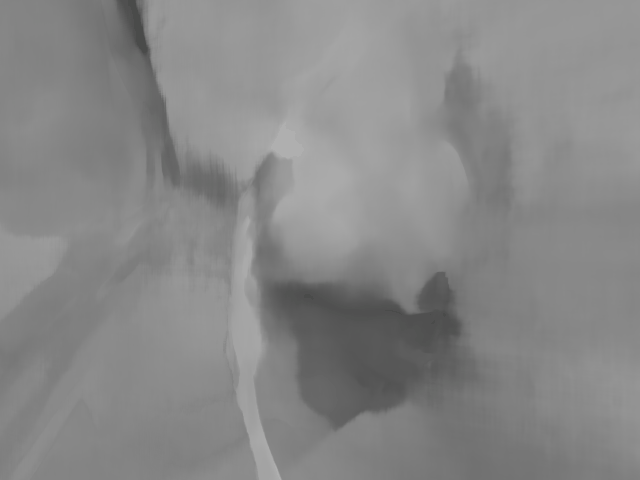

In [ ]:
# Display gif
from IPython.display import Image

gif_file = '/content/nerf_pl/results/llff/stomach/stomach.gif'

Image(open(gif_file,'rb').read())

# Move depth files to drive

In [ ]:
import os

In [ ]:
# save_path = "/content/drive/MyDrive/Grad/research/nerf/EndoSlam/HighCam/Stomach-III/TumorfreeTrajectory_4/depths"
# depths_path = "/content/nerf_pl"

# with open(save_path, "wb") as drive_path:
#   for file in os.listdir(depths_path):
#     if file.startswith("depth_"):
#       drive_path

%cd /content/nerf_pl/results/llff/stomach

%mv stomach.gif /content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions

# %mv *depth_* /content/drive/MyDrive/Grad/research/nerf/EndoSlam/HighCam/Stomach-III/TumorfreeTrajectory_4/depths_bytes
%mv *depth_* /content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/depths_pfm

/content/nerf_pl/results/llff/stomach


# Depth visualizations

In [ ]:
#INVESTIGATE: https://lmb.informatik.uni-freiburg.de/resources/datasets/SceneFlow/assets/code/python_pfm.py
#https://discuss.pytorch.org/t/problem-with-reading-pfm-image/2924
import re
import numpy as np
import sys

# https://github.com/roboception/cvkit/issues/5
def read_pfm(pfm_file_path):
  with open(pfm_file_path, 'rb') as pfm_file:
      header = pfm_file.readline().decode().rstrip()
      channels = 3 if header == 'PF' else 1

      dim_match = re.match(r'^(\d+)\s(\d+)\s$', pfm_file.readline().decode())
      if (dim_match):
          width, height = map(int, dim_match.groups())
      else:
          raise Exception("Malformed PFM header.")

      scale = float(pfm_file.readline().decode().rstrip())
      if scale < 0:
          endian = '<' # littel endian
          scale = -scale
      else:
          endian = '>' # big endian

      disparity = np.fromfile(pfm_file, endian + 'f') / scale

  return disparity, [(height, width, channels), scale]

In [ ]:
# pfm paths
pfm_path = '/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/depths_pfm/'
pfm_file_prefix = 'depth_'
pfm_file_extension = '.pfm'

# save path (i.e. where to save the visualized depth images)
save_path = '/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/depths_pfm/imgs/'

## Depth comparison for before and after XDCycleGAN preprocessing

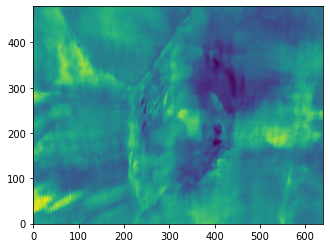

In [ ]:
import matplotlib.pyplot as plt 

pfm_path = '/content/drive/MyDrive/Grad/research/nerf/EndoSlam/HighCam/Stomach-III/TumorfreeTrajectory_4/depths_pfm/'

# get numpy array (1D array of disparity values) from pfm file
disparity, [(height, width, channels), scale] = read_pfm(pfm_path+pfm_file_prefix+'032'+pfm_file_extension)
img_orig = 1.0 / disparity
img2d_orig = np.reshape(img_orig, (height, width)) 

plt.imshow(img2d_orig, origin="lower")
plt.show()

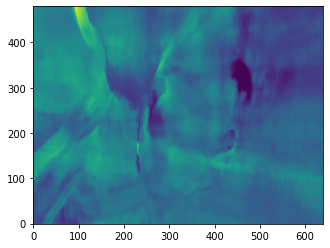

In [ ]:
import matplotlib.pyplot as plt 

pfm_path = '/content/drive/MyDrive/Grad/research/XDCycleGAN/nerf_training_using_xdcyclegan_predictions/depths_pfm/'

# get numpy array (1D array of disparity values) from pfm file
disparity, [(height, width, channels), scale] = read_pfm(pfm_path+pfm_file_prefix+'119'+pfm_file_extension)
img_new = 1.0 / disparity
img2d_new = np.reshape(img_new, (height, width)) 

plt.imshow(img2d_new, origin="lower")
plt.show()

### show plots together

Text(0.5, 1.0, 'With pre-processing')

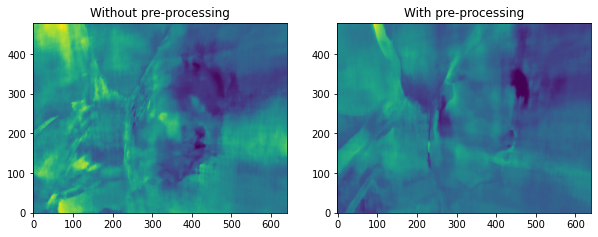

In [ ]:
# create figure
fig = plt.figure(figsize=(10, 7))
  
# setting values to rows and column variables
rows = 1
columns = 2

# Adds a subplot at the 1st position
fig.add_subplot(rows, columns, 1)
  
# showing image
plt.imshow(img2d_orig, origin="lower")
plt.title("Without pre-processing")
  
# Adds a subplot at the 2nd position
fig.add_subplot(rows, columns, 2)
  
# showing image
plt.imshow(img2d_new, origin="lower")
plt.title("With pre-processing")

## Save all pfm files as depth images


In [ ]:
import matplotlib.pyplot as plt 

def save_imgs_depth(numImgs, filePath, filePrefix, fileExtension, savePath):
  for i in range(numImgs):
    filename = filePath + filePrefix + f'{i:03d}' + fileExtension
    # get numpy 1D array from pfm file
    disparity, [(height, width, channels), scale] = read_pfm(filename)
    img = 1.0 / disparity
    img2d = np.reshape(img, (height, width)) 
    # save image
    plt.imshow(img2d, origin="lower")
    plt.savefig(savePath+filePrefix+f'{i:03d}.png')
    plt.close()

save_imgs_depth(120, pfm_path, pfm_file_prefix, pfm_file_extension, save_path)